<h1>Variational Autoencoder Tutorial</h1>

### **Imports and Setup**

---



In [39]:
import h5py
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 100
from IPython.display import display, HTML

# Change this to "cpu" if you are running on CPU instead of GPU
# Change to "cuda" if you are running on GPU
device = "cpu"

# Set up
Hsize=4;Ksize=191;Lsize=191;
dsf_data=[];
proj_data=[];
FS=10
def reflect(S0):
    S0_slice = S0[1:, :]
    S0_reflected = np.concatenate((np.flipud(S0_slice), S0), axis=0)
    S0_reflected = np.concatenate((np.fliplr(S0_reflected[:, 1:]), S0_reflected), axis=1)
    return S0_reflected

### **Download Data**

---



In [2]:
# Download data from Google Drive
import gdown
url='https://drive.google.com/file/d/1hAA1ExxlEgW3PhAl8fkX_YygZT-a1aba/view?usp=drive_link'
gdown.download(url, quiet=True, fuzzy=True, output="data2.jld2")

dataDsfsProjs=h5py.File("./data2.jld2","r")
data_dsfs=dataDsfsProjs["dsf"][:]

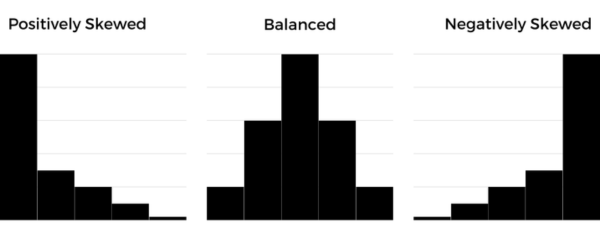

### **Display Normalization Effects**

Skewness: https://www.geeksforgeeks.org/skewness-measures-and-interpretation/

Tanh: https://pytorch.org/docs/stable/generated/torch.nn.Tanh.html

---



In [3]:
def plotHist(num,normfact=1):
  plt.figure(figsize=(15,4))
  dat = data_dsfs[num]
  dat=np.tanh(dat/np.mean(dat)*normfact)
  datTemp=np.reshape(dat,(Lsize,Ksize,4))


  ax1 = plt.subplot2grid(shape=(1, 5), loc=(0, 0), colspan=4)
  ax2 = plt.subplot2grid(shape=(1, 5), loc=(0, 4), colspan=1)
  datCombine=[]

  for idx in range(4):
    if idx==0:
      datCombine=reflect(datTemp[:,:,idx])
    else:
      datCombine=np.append(datCombine,reflect(datTemp[:,:,idx]),axis=0)
  ax1.imshow(datCombine.T)
  ax2.hist(np.reshape(datCombine,-1))
  plt.suptitle(f"Factor: {normfact}", fontsize=24)
  ax1.set_xticks([0, list(datCombine.shape)[0]//4, list(datCombine.shape)[0]*(4/8), list(datCombine.shape)[0]*(6/8), list(datCombine.shape)[0]-1],[-20,-20,-20,-20,20], fontsize=FS)
  ax1.set_xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)],[0,0,0,0], fontsize=FS, minor=True)
  ax1.grid(axis='x', which="major", color="black")
  ax1.set_yticks([0, list(datCombine.shape)[1]//2],[20, 0], fontsize=FS)
  labels = []
  for i in range(4):
    labels.append(f"L in [{i}.25, K, L] (r.l.u)")

  sec = ax1.secondary_xaxis(location=0)
  sec.set_xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)], labels=labels)
  sec.tick_params('x', length=40, width=0)
  sec.set_xticklabels(labels, fontsize=FS)
  ax1.set_ylabel(f"K (r.l.u)", fontsize=FS)
  plt.tight_layout()

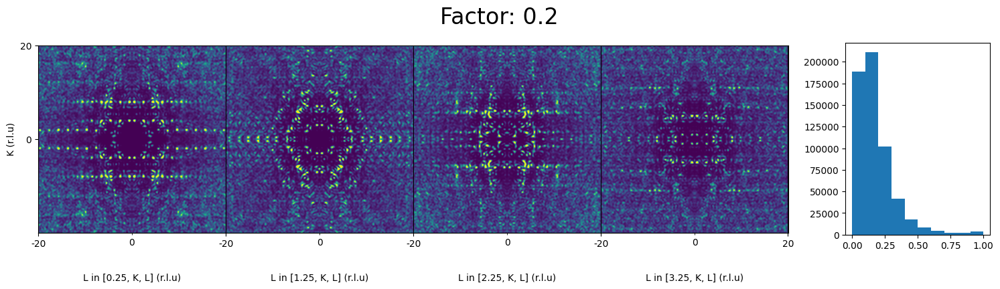

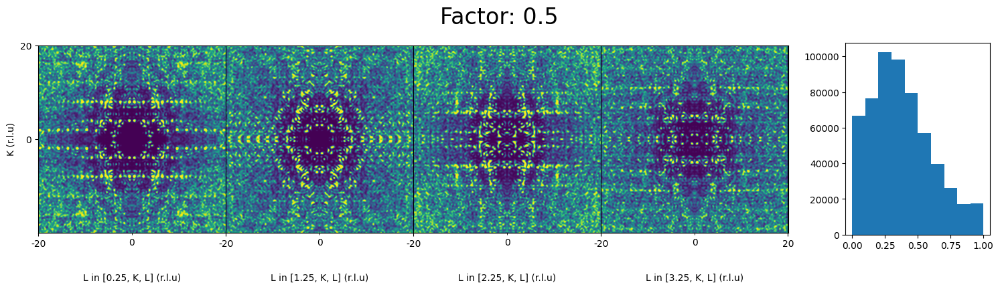

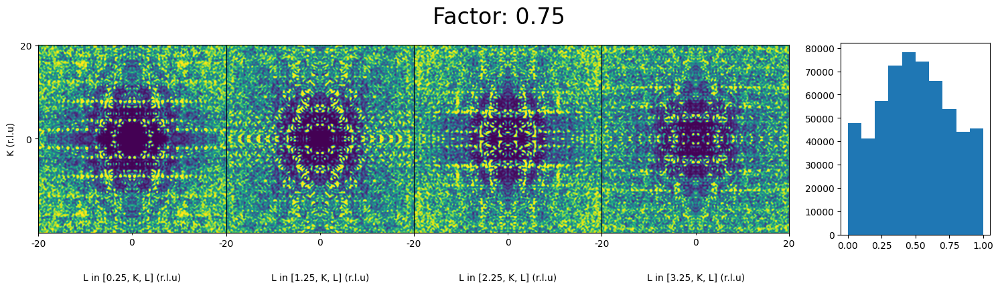

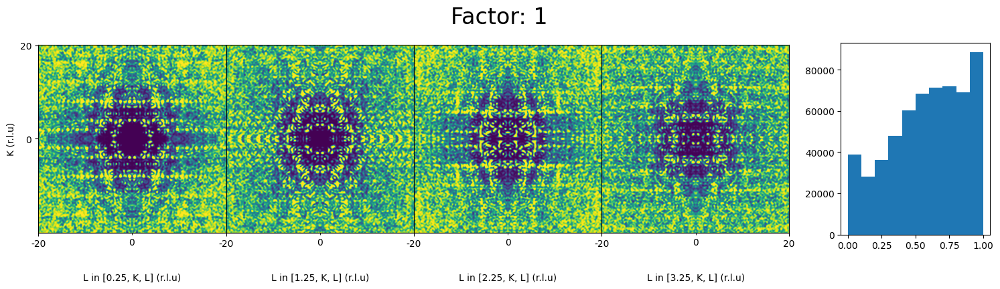

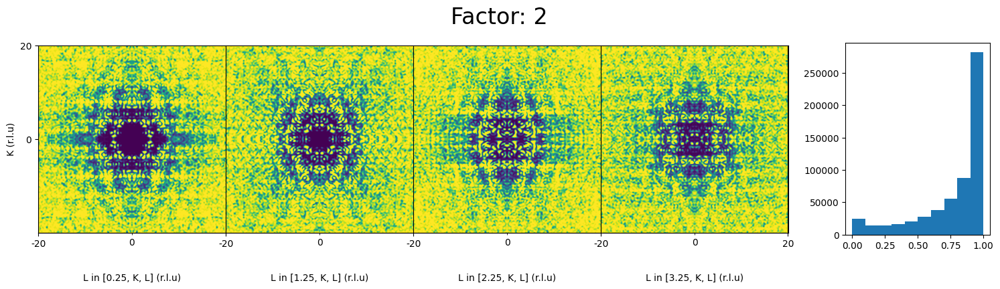

In [40]:
normFactor=[0.2,0.5,0.75,1,2]
for nf in normFactor:
  plotHist(901,nf)

### **Pooling Function**

---

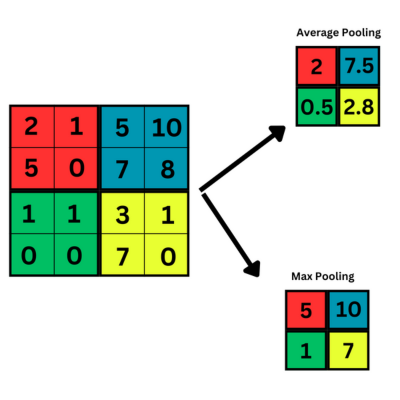

More info here: https://pytorch.org/docs/stable/generated/torch.nn.AvgPool2d.html,
https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html



In [5]:
# Average pooling to compress data
def compress(data, kernel, type="avg"):

  if type == "avg":
    pool = nn.AvgPool2d(kernel_size=kernel)
  else:
    pool = nn.MaxPool2d(kernel_size=kernel)
  pooled_data = pool(data)

  return(pooled_data)

### **Function to Display Pooling Effects**

---



In [6]:
normfact=0.75
def displayPooling(num, kernelsize=1):
    plt.rcParams['figure.dpi'] = 100
    plt.figure(figsize=(12, 3))
    dat = data_dsfs[num]
    dat=np.tanh(dat/np.mean(dat)*normfact)
    dat = torch.from_numpy(dat)
    dat=dat.detach().to("cpu");
    dat=np.reshape(dat,(Lsize,Ksize,4))
    datCombine=[]
    for idx in range(4):
        datTemp = dat.permute(*torch.arange(dat.ndim - 1, -1, -1))
        datTemp = compress(datTemp, kernelsize)
        datTemp = datTemp.permute(*torch.arange(datTemp.ndim - 1, -1, -1))
        if idx==0:
          datCombine=reflect(datTemp[:,:,idx])
        else:
          datCombine=np.append(datCombine,reflect(datTemp[:,:,idx]),axis=0)

    plt.title("Kernel Size: " + str(kernelsize) + ", Pixel Size: " + str(list(datCombine.shape)), fontsize=FS)
    plt.imshow(datCombine.T)
    plt.plot()
    plt.xticks([0, list(datCombine.shape)[0]//4, list(datCombine.shape)[0]*(4/8), list(datCombine.shape)[0]*(6/8), list(datCombine.shape)[0]-1],[-20,-20,-20,-20,20], fontsize=FS)
    plt.xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)],[0,0,0,0], fontsize=FS, minor=True)
    ax = plt.gca()
    ax.grid(axis='x', which="major", color="black")
    plt.yticks([0, list(datCombine.shape)[1]//2],[20, 0], fontsize=FS)
    labels = []
    for i in range(4):
      labels.append(f"L in [{i}.25, K, L] (r.l.u)")

    sec = ax.secondary_xaxis(location=0)
    sec.set_xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)], labels=labels)
    sec.tick_params('x', length=40, width=0)
    sec.set_xticklabels(labels, fontsize=FS)
    plt.ylabel(f"K (r.l.u)", fontsize=FS)
    plt.tight_layout()

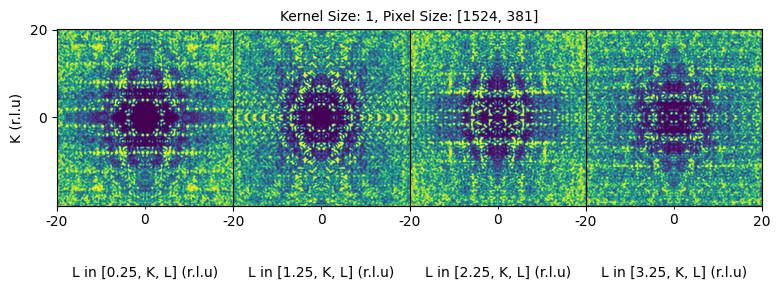

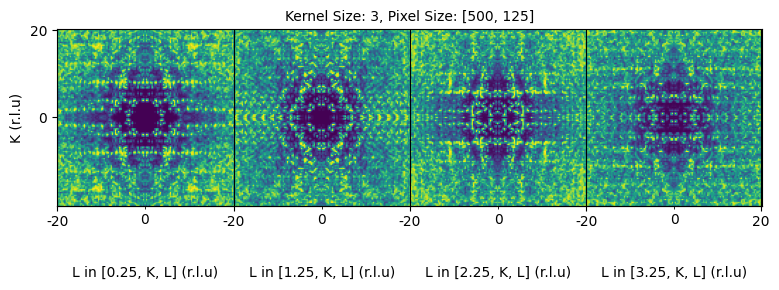

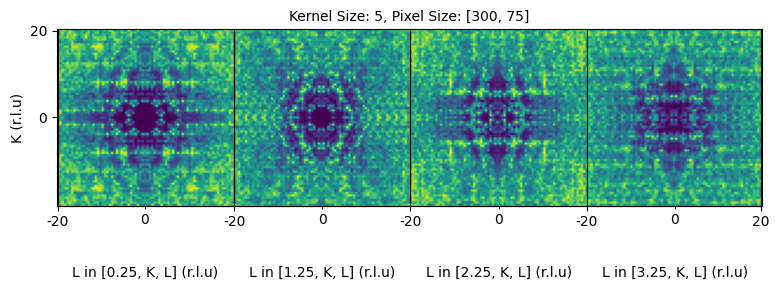

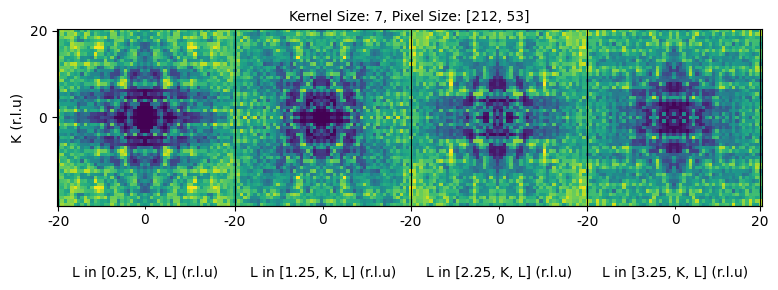

In [7]:
# Show the effects of kernel sizes for 4 samples
for i in range(4):
  displayPooling(901,i*2+1)

### **Prepare Data**

Pool and normalize the data before training

---



In [8]:
# Select hyperparameters
kernel_size = 3
pooling_type = "avg"
normFactor = 0.75

In [9]:
Bsize=64
normdata_dsfs=np.zeros((len(data_dsfs),(Ksize//kernel_size)**2*4))
for i in range(len(data_dsfs)):
    dat=1*data_dsfs[i,:]
    dat=np.tanh(dat/np.mean(dat) * normFactor)
    dat=np.reshape(dat,(Lsize,Ksize,4))
    dat = torch.from_numpy(dat)
    datRaw = dat
    dat = dat.permute(*torch.arange(dat.ndim - 1, -1, -1))
    dat = compress(dat, kernel_size, type=pooling_type)
    dat = dat.permute(*torch.arange(dat.ndim - 1, -1, -1))
    dat = np.reshape(dat,-1)
    normdata_dsfs[i,:]=dat

data_all=torch.utils.data.DataLoader(torch.utils.data.TensorDataset(torch.tensor(normdata_dsfs,dtype=torch.float32), torch.tensor(dataDsfsProjs["msd"][:],dtype=torch.float32), torch.tensor(dataDsfsProjs["ptype"][:],dtype=torch.float32)), batch_size=Bsize, shuffle=True)

### **Define VAE Model**

---



In [10]:
class VAE(nn.Module):
    def __init__(self, image_channels=1, input_dims=[Hsize,Ksize,Lsize],hidden_dims=[512,128,32], lat_dim=2):
        super(VAE, self).__init__()
        encoders=[
            nn.Linear(input_dims[0]*input_dims[1]*input_dims[2], hidden_dims[0]),
            nn.ReLU()]
        decoders=[nn.ReLU()]

        for i in range(np.size(hidden_dims)-1):
            encoders.append(nn.Linear(hidden_dims[i],hidden_dims[i+1]))
            encoders.append(nn.ReLU())
            decoders.append(nn.Linear(hidden_dims[-1-i],hidden_dims[-2-i]))
            decoders.append(nn.ReLU())

        decoders.append(nn.Linear(hidden_dims[0],input_dims[0]*input_dims[1]*input_dims[2]))
        decoders.append(nn.Sigmoid())

        self.encoder = nn.Sequential(*encoders)
        self.decoder = nn.Sequential(*decoders)

        self.fc1 = nn.Linear(hidden_dims[-1], lat_dim)
        self.fc2 = nn.Linear(hidden_dims[-1], lat_dim)
        self.fc3 = nn.Linear(lat_dim, hidden_dims[-1])

    def generate(self,mu):
        z = self.fc3(mu)
        return self.decoder(z)

    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_().to(device)
        esp = torch.randn(*mu.size()).to(device)
        z = mu + std * esp
        return z

    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar

    def representation(self, x):
        return self.bottleneck(self.encoder(x))[0]

    def forward(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        z = self.fc3(z)
        return self.decoder(z), mu, logvar

def loss_fn(recon_x, x, mu, logvar):
    MSE =  ((x - recon_x)**2).sum()
    KLD = -0.5 * torch.sum(1 + logvar - mu**2 -  logvar.exp())
    return MSE, KLD

### **Create VAE Model**

---



In [11]:
autoencoder = VAE(input_dims=[4,(Ksize//kernel_size),(Lsize//kernel_size)],hidden_dims=[512,128,32,8],lat_dim=8)
# If it says no NVIDIA driver for this device, please refer to cell 1 under the imports
autoencoder=autoencoder.to(device)
# Adam optimizer: https://arxiv.org/abs/1412.6980
opt = torch.optim.Adam(autoencoder.parameters(),betas=(0.9,0.99))
autoencoder

# Hyperparameter: Try experimenting with the shape of the hidden dimensions
# (hidden_dims) or the number of latent dimensions (lat_dim)

VAE(
  (encoder): Sequential(
    (0): Linear(in_features=15876, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=32, bias=True)
    (5): ReLU()
    (6): Linear(in_features=32, out_features=8, bias=True)
    (7): ReLU()
  )
  (decoder): Sequential(
    (0): ReLU()
    (1): Linear(in_features=8, out_features=32, bias=True)
    (2): ReLU()
    (3): Linear(in_features=32, out_features=128, bias=True)
    (4): ReLU()
    (5): Linear(in_features=128, out_features=512, bias=True)
    (6): ReLU()
    (7): Linear(in_features=512, out_features=15876, bias=True)
    (8): Sigmoid()
  )
  (fc1): Linear(in_features=8, out_features=8, bias=True)
  (fc2): Linear(in_features=8, out_features=8, bias=True)
  (fc3): Linear(in_features=8, out_features=8, bias=True)
)

### **Train Model**

---



In [12]:
# Hyperparameters
epochs = 100
beta = 5.0 # (value multiplied with KL divergence)

KeyboardInterrupt: 

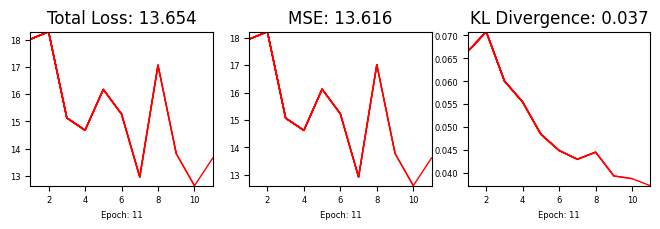

In [13]:
# Note: If training is taking too long, try lowering the epochs or
# simplifying the hidden dimensions (hidden_dims)

import copy
from IPython import display
import time

for i,param in enumerate(autoencoder.parameters()):
  if i >= 0:
      param.requires_grad=True
for g in opt.param_groups:
  g['lr'] = 10e-5

losses=np.empty((3,epochs))
losses[:,1:]=np.nan
np.set_printoptions(suppress=True)
bestloss=1e10

# Set up plots
fig = plt.figure(figsize=(8,2))
total_plot = fig.add_subplot(1, 3, 1)
mse_plot = fig.add_subplot(1, 3, 2)
KL_plot = fig.add_subplot(1, 3, 3)
x_plot = []
y_plot = []

for epoch in range(epochs):
  batchloss=torch.tensor(losses[:,0],dtype=torch.float32)
  for x_input, y, z in data_all:
      x_input = x_input[0].to(device)
      opt.zero_grad()
      x_output,mu,logvar = autoencoder(x_input)
      mse,kld=loss_fn(x_output, x_input, mu, logvar)
      kld*=20
      loss=mse+kld
      batchloss+=torch.tensor([loss,mse,kld])
      loss=loss/x_input.shape[0]
      loss.backward()
      opt.step()

  losses[:,epoch]=(batchloss/len(data_all.dataset)).detach().to('cpu').numpy()

  if batchloss[0] < bestloss:
      bestloss = batchloss[0]
      best_model_wts=copy.deepcopy(autoencoder.state_dict())
      state={'state_dict':autoencoder.state_dict(),
            'best_loss':bestloss,
            'optimizer':opt.state_dict()}
      savefilename='VAE_PhononProj2.pt'
      torch.save(state,savefilename)

  # Plot loss
  x_plot.append(epoch + 1)
  y_plot.append(losses[:,epoch])

  # Plot total loss
  total_plot.plot(x_plot, [n[0] for n in y_plot], linewidth=1, color= 'red')
  total_plot.set_xlim(min(x_plot), max(x_plot))
  total_plot.set_ylim(min([n[0] for n in y_plot]), max([n[0] for n in y_plot]))
  total_plot.set_xlabel(f"Epoch: {x_plot[-1]}", fontsize=6)
  total_plot.title.set_text(f"Total Loss: {[n[0] for n in y_plot][-1]:.3f}")
  total_plot.xaxis.set_tick_params(labelsize=6)
  total_plot.yaxis.set_tick_params(labelsize=6)

  # Plot MSE
  mse_plot.plot(x_plot, [n[1] for n in y_plot], linewidth=1, color= 'red')
  mse_plot.set_xlim(min(x_plot), max(x_plot))
  mse_plot.set_ylim(min([n[1] for n in y_plot]), max([n[1] for n in y_plot]))
  mse_plot.set_xlabel(f"Epoch: {x_plot[-1]}", fontsize=6)
  mse_plot.title.set_text(f"MSE: {[n[1] for n in y_plot][-1]:.3f}")
  mse_plot.xaxis.set_tick_params(labelsize=6)
  mse_plot.yaxis.set_tick_params(labelsize=6)

  # Plot KL divergence
  KL_plot.plot(x_plot, [n[2] for n in y_plot], linewidth=1, color= 'red')
  KL_plot.set_xlim(min(x_plot), max(x_plot))
  KL_plot.set_ylim(min([n[2] for n in y_plot]), max([n[2] for n in y_plot]))
  KL_plot.set_xlabel(f"Epoch: {x_plot[-1]}", fontsize=6)
  KL_plot.title.set_text(f"KL Divergence: {[n[2] for n in y_plot][-1]:.3f}")
  KL_plot.xaxis.set_tick_params(labelsize=6)
  KL_plot.yaxis.set_tick_params(labelsize=6)

  display.display(plt.gcf())
  time.sleep(0.01)
  display.clear_output(wait =True)

  if epoch % 500 ==499:
      loadstate=torch.load(savefilename)
      autoencoder.load_state_dict(loadstate['state_dict'])
      opt.load_state_dict(loadstate['optimizer'])


### **Display Original and Recreation**

---



In [14]:
def displayResult(num):
    plt.figure(figsize=(18,6))
    dat=data_all.dataset.tensors[0][num].to(device)
    recon,lat,_=autoencoder(dat)
    dat=dat.detach().to("cpu");recon=recon.detach().to("cpu");lat=lat.detach().to("cpu");
    dat=np.reshape(dat,((Ksize//kernel_size),(Lsize//kernel_size),4))
    recon=np.reshape(recon,((Ksize//kernel_size),(Lsize//kernel_size),4))

    datCombine=[]
    datCombine2=[]

    for idx in range(4):
      if idx==0:
        datCombine=reflect(dat[:,:,idx])
        datCombine2=reflect(recon[:,:,idx])
      else:
        datCombine=np.append(datCombine,reflect(dat[:,:,idx]),axis=0)
        datCombine2=np.append(datCombine2,reflect(recon[:,:,idx]),axis=0)

    # Plot data
    plt.suptitle(f"Sample #{num}")
    ax1 = plt.subplot(2,1,1)
    ax1.set_title("Original Data", fontsize=10)
    plt.imshow(datCombine.T)
    plt.xticks([0, list(datCombine.shape)[0]//4, list(datCombine.shape)[0]*(4/8), list(datCombine.shape)[0]*(6/8), list(datCombine.shape)[0]-1],[-20,-20,-20,-20,20], fontsize=FS)
    plt.xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)],[0,0,0,0], fontsize=FS, minor=True)
    ax = plt.gca()
    ax.grid(axis='x', which="major", color="black")
    plt.yticks([0, list(datCombine.shape)[1]//2],[20, 0], fontsize=FS)
    labels = []
    for i in range(4):
      labels.append(f"L in [{i}.25, K, L] (r.l.u)")

    sec = ax.secondary_xaxis(location=0)
    sec.set_xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)], labels=labels)
    sec.tick_params('x', length=40, width=0)
    sec.set_xticklabels(labels, fontsize=FS)
    plt.ylabel(f"K (r.l.u)", fontsize=FS)

    ax2 = plt.subplot(2,1,2)
    ax2.set_title("Recreated Data", fontsize=10)
    plt.imshow(datCombine2.T)
    plt.xticks([0, list(datCombine.shape)[0]//4, list(datCombine.shape)[0]*(4/8), list(datCombine.shape)[0]*(6/8), list(datCombine.shape)[0]-1],[-20,-20,-20,-20,20], fontsize=FS)
    plt.xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)],[0,0,0,0], fontsize=FS, minor=True)
    ax = plt.gca()
    ax.grid(axis='x', which="major", color="black")
    plt.yticks([0, list(datCombine.shape)[1]//2],[20, 0], fontsize=FS)
    labels = []
    for i in range(4):
      labels.append(f"L in [{i}.25, K, L] (r.l.u)")

    sec = ax.secondary_xaxis(location=0)
    sec.set_xticks([list(datCombine.shape)[0]//8,list(datCombine.shape)[0]*(3/8), list(datCombine.shape)[0]*(5/8),list(datCombine.shape)[0]*(7/8)], labels=labels)
    sec.tick_params('x', length=40, width=0)
    sec.set_xticklabels(labels, fontsize=FS)
    plt.ylabel(f"K (r.l.u)", fontsize=FS)
    plt.tight_layout()

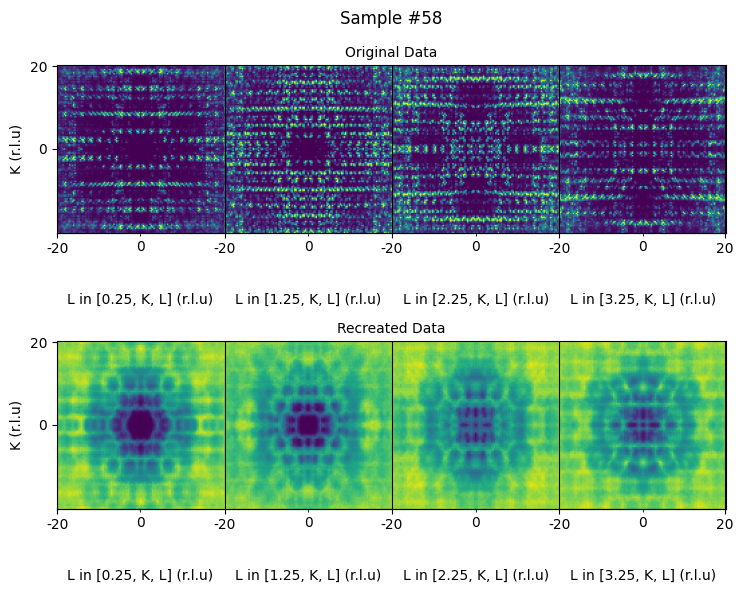

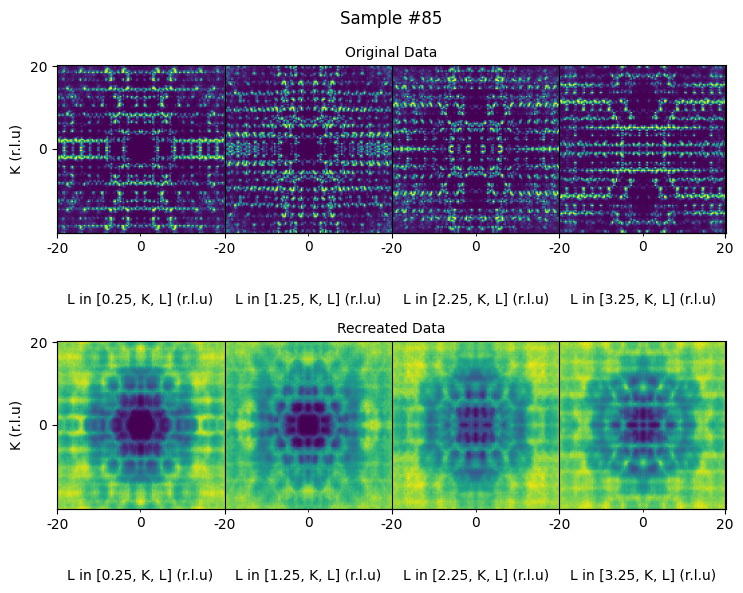

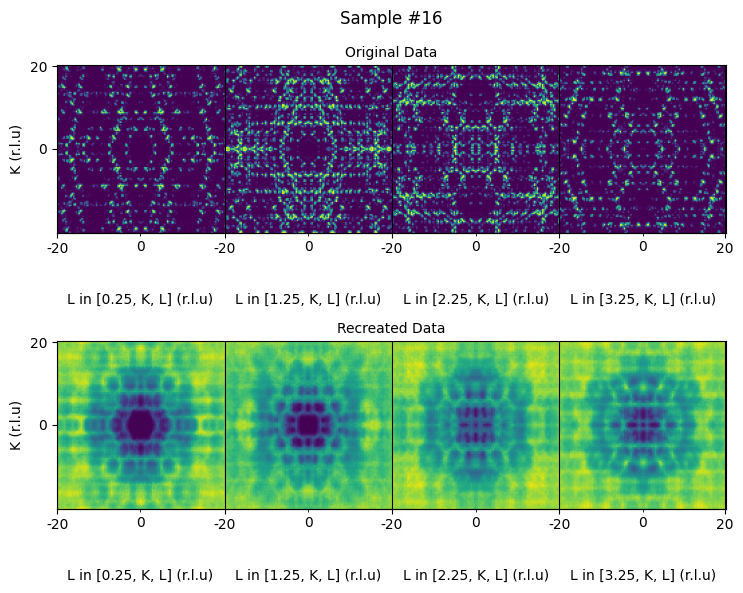

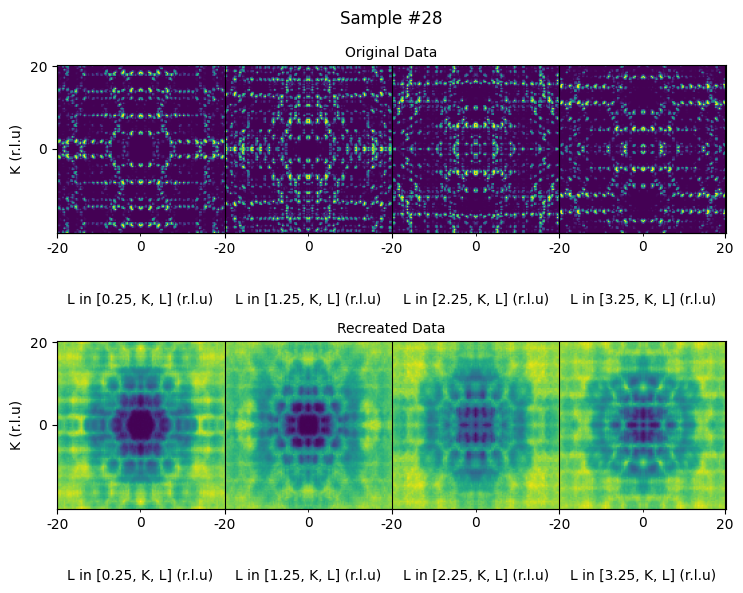

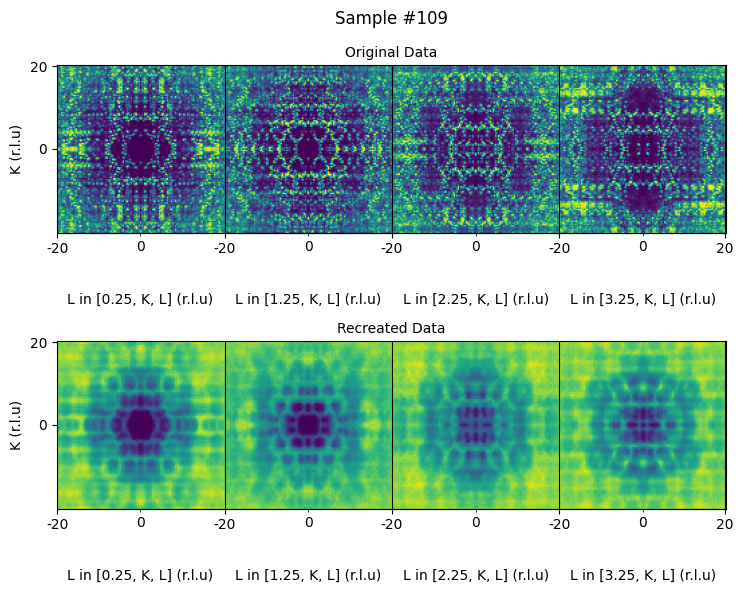

In [15]:
# Call function to display
for i in range(5):
  displayResult(np.random.randint(200))

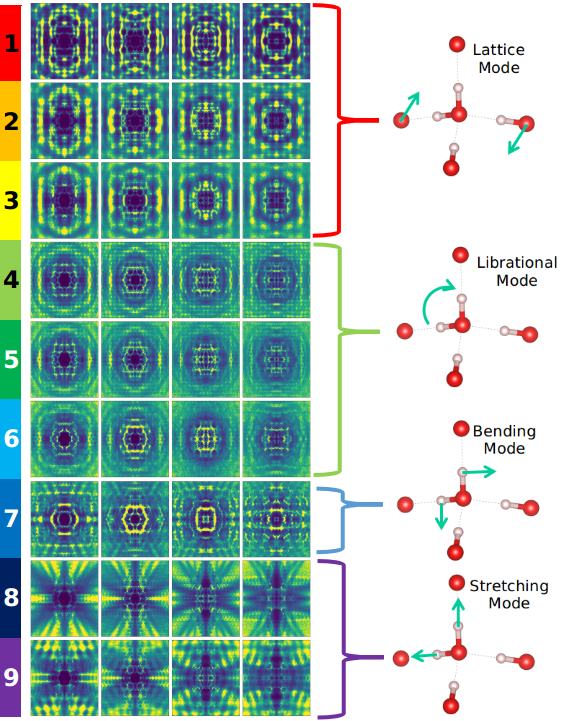

### **Display Latent Space**



---

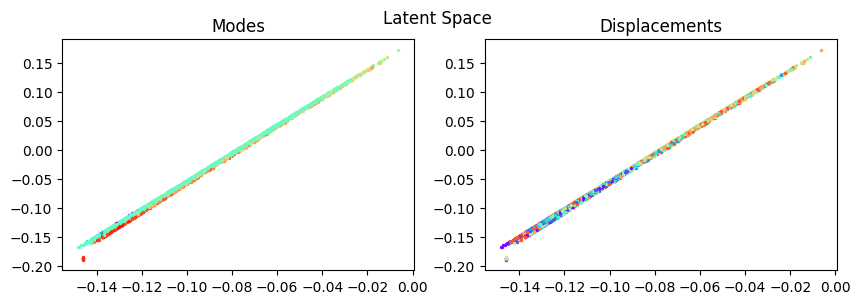

In [31]:
# Please note that the graphs are a 2d representation for more clear visualizations
# The full space has the dimentions specified by the latent dimentions

from mpl_toolkits.axes_grid1 import make_axes_locatable
coords = []
modes = []
displacements = []
for x_input, mode, disp in data_all:
  mode = mode.detach().numpy()
  disp = disp.detach().numpy()
  for i in range(len(mode)):
    x_output,mu,logvar = autoencoder(x_input[i].to(device))
    # Change indices of mu (0 : lat_dim - 1) to view from different perspectives
    coords.append([mu[0].detach().to("cpu"), mu[1].detach().to("cpu")])
    modes.append(mode[i])
    displacements.append(disp[i])

# Create plots
fig = plt.figure(figsize = (10, 3))
mode_plot = fig.add_subplot(1, 2, 1)
disp_plot = fig.add_subplot(1, 2, 2)

# Create color maps for plots
cmap = plt.get_cmap("rainbow_r")

# Normalize under 1 to work with cmap
modes /= max(modes)
displacements /= max(displacements)

for i, (x,y) in enumerate(coords):
  mode_show = mode_plot.scatter(x, y, s=2, color=cmap(modes[i]))
  disp_plot.scatter(x, y, s=2, color=cmap(displacements[i]))

fig.suptitle("Latent Space")
mode_plot.title.set_text("Modes")

disp_plot.title.set_text("Displacements")

plt.show()

# Note: Increaing beta may help create a more interpretable seperation of
# latent space. Read more about disentanglement here: https://www.geeksforgeeks.org/disentanglement-in-beta-variational-autoencoders/

### **Display Latent Space With PCA**



---

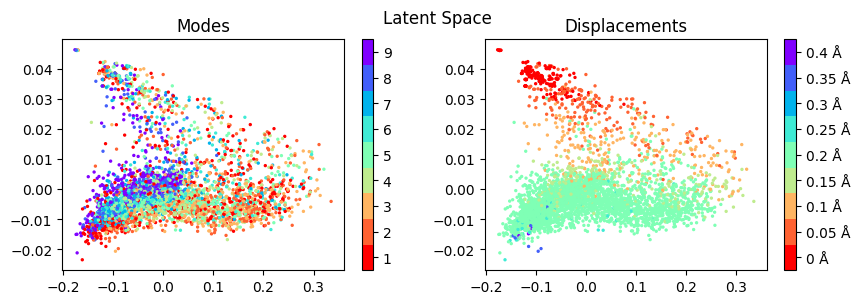

In [16]:
from sklearn.decomposition import PCA
coords0 = []
modes0 = []
displacements0 = []
for x_input, disp, mode in data_all:
    mode = mode.detach().numpy()
    disp = disp.detach().numpy()
    for i in range(len(mode)):
        x_output, mu, logvar = autoencoder(x_input[i].to(device))
        # Collect coordinates for PCA
        coords0.append(mu.detach().to("cpu").numpy())
        modes0.append(mode[i])
        displacements0.append(disp[i])

# Convert lists to numpy arrays
coords = np.array(coords0)
modes = np.array(modes0)
displacements = np.array(displacements0)

# Perform PCA
pca = PCA(n_components=2)
coords_pca = pca.fit_transform(coords)

# Normalize to range [0, 8]
displacements = (displacements / max(displacements) * 8).astype(int)
cmap = plt.get_cmap("rainbow_r")
# Create plots
fig, (mode_plot, disp_plot) = plt.subplots(1, 2, figsize=(10, 3))
sc_modes = mode_plot.scatter(coords_pca[:, 0], coords_pca[:, 1], s=2, c=modes, cmap=cmap)
sc_disps = disp_plot.scatter(coords_pca[:, 0], coords_pca[:, 1], s=2, c=displacements, cmap=cmap)
# Add colorbars
cbar_modes = fig.colorbar(sc_modes, ax=mode_plot, ticks=np.arange(1,10), boundaries=np.arange(0.5, 10.5, 1))
cbar_disps = fig.colorbar(sc_disps, ax=disp_plot, ticks=np.arange(9), boundaries=np.arange(-0.5, 9.5, 1))
cbar_modes.set_ticklabels(np.arange(1, 10))
cbar_disps.set_ticklabels(['0 Å','0.05 Å','0.1 Å','0.15 Å','0.2 Å','0.25 Å','0.3 Å','0.35 Å','0.4 Å'])

fig.suptitle("Latent Space")
mode_plot.set_title("Modes")
disp_plot.set_title("Displacements")

plt.show()

### **Generate Data**

---



In [17]:
# Define function to generate data
def generateResult(mu):
    mu = torch.tensor(mu,dtype=torch.float32).to(device)
    plt.figure(figsize=(22,12))
    recon=autoencoder.generate(mu)
    recon=recon.detach().to('cpu')
    recon=np.reshape(recon,((Ksize//kernel_size),(Lsize//kernel_size),4))
    datCombine=[]

    for idx in range(4):
      if idx==0:
        datCombine=reflect(recon[:,:,idx])
      else:
        datCombine=np.append(datCombine,reflect(recon[:,:,idx]),axis=0)
    plt.subplot(2,4,1)
    plt.imshow(datCombine.T)

    plt.axis("off")
    plt.tight_layout()

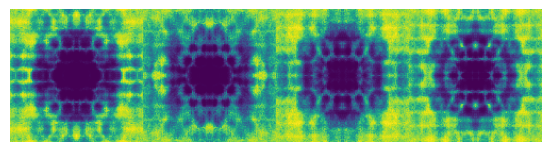

In [38]:
# Enter coordinates for data (refer to latent space graph above)
generateResult(10*np.random.randn(8))

### **Test Different Model Shapes *(OPTIONAL)***

More info on grid search here: https://www.w3schools.com/python/python_ml_grid_search.asp

More info on hyperparameter optimization here: https://www.geeksforgeeks.org/hyperparameters-optimization-methods-ml/



---

In [ ]:
# Grid search
# Example dimensions [256,128,32,8], [256,64,16], [256,128,64,32,8],[128,64,32,16,8]
# Start large, get smaller
# Conventionally use powers of 2
# hidden_dims_params lists all the hidden dims to be evaluated
hidden_dims_params = [[512,128,32], [512,128,32,8]]

# Experiment with these values too
epochs = 100
beta = 10.0

# Consider grid search libraries if you want to search more types of params
# https://scikit-learn.org/stable/modules/grid_search.html

# Also consider more efficient methods
# https://scikit-optimize.github.io/stable/modules/generated/skopt.BayesSearchCV.html

# Note: hyperparameter tuning can quickly become very time/resource intensive,
# so be mindful and strategic about how you select parameters

final_loss = []
final_times = []

for idx, params in enumerate(hidden_dims_params):
  print("training: ", str(params))
  start_time = time.time()
  autoencoder = VAE(input_dims=[4,(Ksize//kernel_size),(Lsize//kernel_size)],hidden_dims=params,lat_dim=3)
  autoencoder=autoencoder.to(device)
  opt = torch.optim.Adam(autoencoder.parameters(),betas=(0.9,0.99))
  for i,param in enumerate(autoencoder.parameters()):
    if i >= 0:
        param.requires_grad=True
  for g in opt.param_groups:
    g['lr'] = 10e-5

  losses=np.empty((3,epochs))
  losses[:,1:]=np.nan
  np.set_printoptions(suppress=True)
  bestloss=1e10

  fig = plt.figure()

  for epoch in range(epochs):
    batchloss=torch.tensor(losses[:,0],dtype=torch.float32)
    for x_input, y, z in data_all:
        x_input = x_input[0].to(device)
        opt.zero_grad()
        x_output,mu,logvar = autoencoder(x_input)
        mse,kld=loss_fn(x_output, x_input, mu, logvar)
        kld*=20
        loss=mse+kld
        batchloss+=torch.tensor([loss,mse,kld])
        loss=loss/x_input.shape[0]
        loss.backward()
        opt.step()

    losses[:,epoch]=(batchloss/len(data_all.dataset)).detach().to('cpu').numpy()

    if batchloss[0] < bestloss:
        bestloss = batchloss[0]
        best_model_wts=copy.deepcopy(autoencoder.state_dict())
        state={'state_dict':autoencoder.state_dict(),
              'best_loss':bestloss,
              'optimizer':opt.state_dict()}
        savefilename=f"VAE_PhononProj_GridSearch{idx}.pt"
        torch.save(state,savefilename)

    if epoch % 500 ==499:
        loadstate=torch.load(savefilename)
        autoencoder.load_state_dict(loadstate['state_dict'])
        opt.load_state_dict(loadstate['optimizer'])
    print("Epoch: ", epoch)
  final_loss.append(y_plot[-1][0])
  final_times.append(time.time() - start_time)

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(final_times, final_loss)
for i, dims in enumerate(hidden_dims_params):
    ax.annotate(str(dims), (final_times[i], final_loss[i]))
plt.xlabel("Time (s)")
plt.ylabel("Total Loss")
plt.tight_layout()
plt.show()
plt.savefig(f"grid_search_results.png")

# Result of grid search is saved in temp files (folder icon on the left) as
# grid_search_results.png. Make sure to save to your local device or Drive
# or it will be lost when the session is restarted
